In [1]:
!unzip "/content/hcaugmented-20251012T064057Z-1-001.zip" -d "/content/dataset/"
!unzip "/content/lcaugmented-20251012T081124Z-1-001.zip" -d "/content/dataset/"

Archive:  /content/hcaugmented-20251012T064057Z-1-001.zip
  inflating: /content/dataset/hcaugmented/img3853.jpg  
  inflating: /content/dataset/hcaugmented/img3439.jpg  
  inflating: /content/dataset/hcaugmented/img3223.jpg  
  inflating: /content/dataset/hcaugmented/img3341.jpg  
  inflating: /content/dataset/hcaugmented/img2728.jpg  
  inflating: /content/dataset/hcaugmented/img3402.jpg  
  inflating: /content/dataset/hcaugmented/img2867.jpg  
  inflating: /content/dataset/hcaugmented/img2447.jpg  
  inflating: /content/dataset/hcaugmented/img3307.jpg  
  inflating: /content/dataset/hcaugmented/img2752.jpg  
  inflating: /content/dataset/hcaugmented/img2879.jpg  
  inflating: /content/dataset/hcaugmented/img2780.jpg  
  inflating: /content/dataset/hcaugmented/img2701.jpg  
  inflating: /content/dataset/hcaugmented/img3018.jpg  
  inflating: /content/dataset/hcaugmented/img3151.jpg  
  inflating: /content/dataset/hcaugmented/img3892.jpg  
  inflating: /content/dataset/hcaugmented/img2

In [3]:
!pip install split-folders
import splitfolders
splitfolders.ratio("/content/dataset",output="dataset",ratio=(.8,.1,.1),seed=1337)

Copying files: 2513 files [00:00, 8037.11 files/s]


In [4]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf

In [8]:
train_dir = "/content/dataset/train"
validation_dir = "/content/dataset/val"
test_dir="/content/dataset/test"

BATCH_SIZE = 32
IMG_SIZE = (160, 160)

train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
validation_dataset = tf.keras.utils.image_dataset_from_directory(validation_dir,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)

test_dataset = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)

Found 2010 files belonging to 2 classes.
Found 251 files belonging to 2 classes.
Found 252 files belonging to 2 classes.


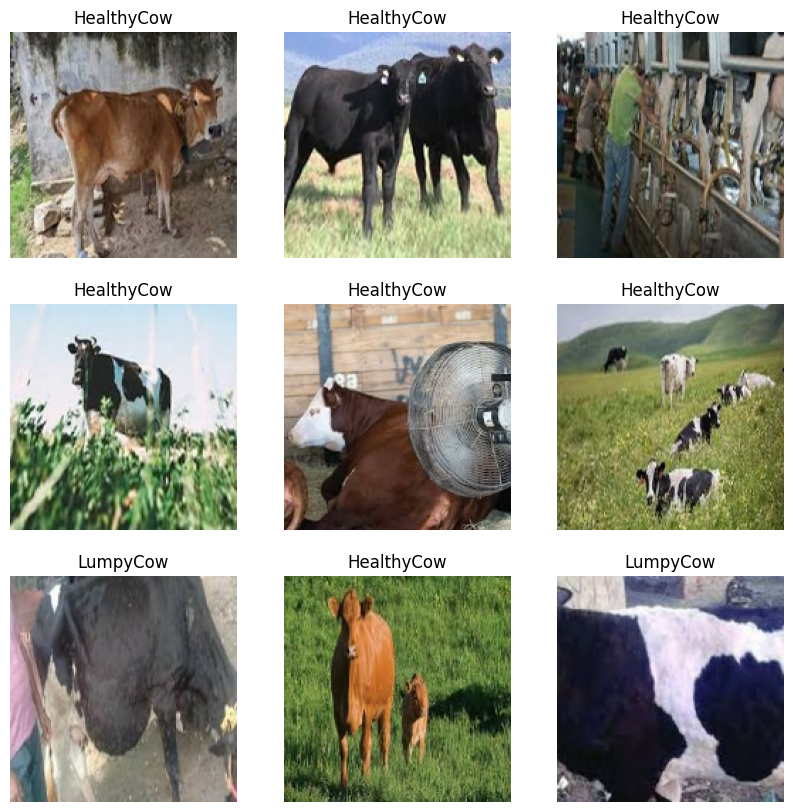

In [9]:
class_names = train_dataset.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [10]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

In [11]:
preprocess_input = tf.keras.applications.efficientnet.preprocess_input

# **Base Model**

In [12]:
IMG_SHAPE = IMG_SIZE + (3,)
base_model=tf.keras.applications.EfficientNetB4(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights='imagenet'
)

71686520/71686520 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [13]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1792)


In [14]:
base_model.trainable = False
base_model.summary()

Model: "efficientnetb4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 160, 160,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 160, 160,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 160, 160,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 161, 161,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 80, 80,    │      1,296 │ stem_conv_pad[0]… │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 80, 80,    │        192 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 80, 80,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 80, 80,    │        432 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 80, 80,    │        192 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 80, 80,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 48)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 48)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 12)  │        588 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 48)  │        624 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 80, 80,    │          0 │ block1a_activati… │
│ (Multiply)          │ 48)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 80, 80,    │      1,152 │ block1a_se_excit

 Total params: 17,673,823 (67.42 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 17,673,823 (67.42 MB)

In [23]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1792)


In [29]:
prediction_layer = tf.keras.layers.Dense(1, activation='sigmoid')
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1)


In [30]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [31]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb4 (Functional)     │ (None, 5, 5, 1792)     │    17,673,823 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1792)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1792)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │         1,793 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,675,616 (67.43 MB)

 Trainable params: 1,793 (7.00 KB)

 Non-trainable params: 17,673,823 (67.42 MB)

In [32]:
len(model.trainable_variables)

2

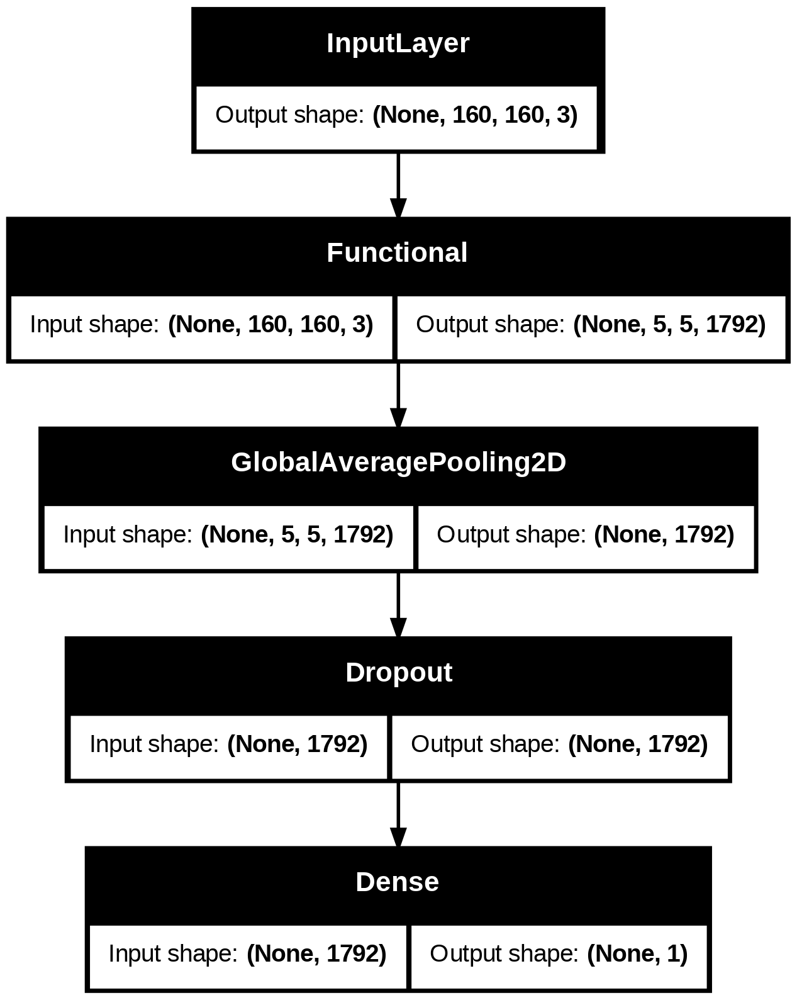

In [33]:
tf.keras.utils.plot_model(model, show_shapes=True)

# **Compile model**

In [37]:
#Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                       tf.keras.metrics.Precision(name='precision'),
                       tf.keras.metrics.Recall(name='recall')
                       ]
              )

In [38]:
%load_ext tensorboard
from datetime import datetime
from packaging import version
# Define the Keras TensorBoard callback.
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [40]:
#Train model
initial_epochs = 10

loss0, accuracy0, precision0, recall0 = model.evaluate(validation_dataset)

8/8 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.5929 - loss: 0.6663 - precision: 0.4842 - recall: 0.3793


In [42]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))
print("initial precision: {:.2f}".format(precision0))
print("initial recall: {:.2f}".format(recall0))

initial loss: 0.68
initial accuracy: 0.54
initial precision: 0.41
initial recall: 0.33


In [46]:
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset)

Epoch 1/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 225s 4s/step - accuracy: 0.9096 - loss: 0.2492 - precision: 0.9015 - recall: 0.8593 - val_accuracy: 0.8566 - val_loss: 0.2916 - val_precision: 0.8495 - val_recall: 0.7822
Epoch 2/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 257s 4s/step - accuracy: 0.9106 - loss: 0.2460 - precision: 0.9011 - recall: 0.8703 - val_accuracy: 0.8526 - val_loss: 0.2872 - val_precision: 0.8404 - val_recall: 0.7822
Epoch 3/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 205s 3s/step - accuracy: 0.9028 - loss: 0.2498 - precision: 0.8981 - recall: 0.8445 - val_accuracy: 0.8606 - val_loss: 0.2904 - val_precision: 0.8667 - val_recall: 0.7723
Epoch 4/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 222s 4s/step - accuracy: 0.9009 - loss: 0.2511 - precision: 0.8961 - recall: 0.8550 - val_accuracy: 0.8606 - val_loss: 0.2852 - val_precision: 0.8587 - val_recall: 0.7822
Epoch 5/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 246s 3s/step - accuracy: 0.9180 - loss: 0.2293 - precision: 0.9104 - recall: 0.8694 - val_accuracy: 0.8606 - val_loss: 0.2850 

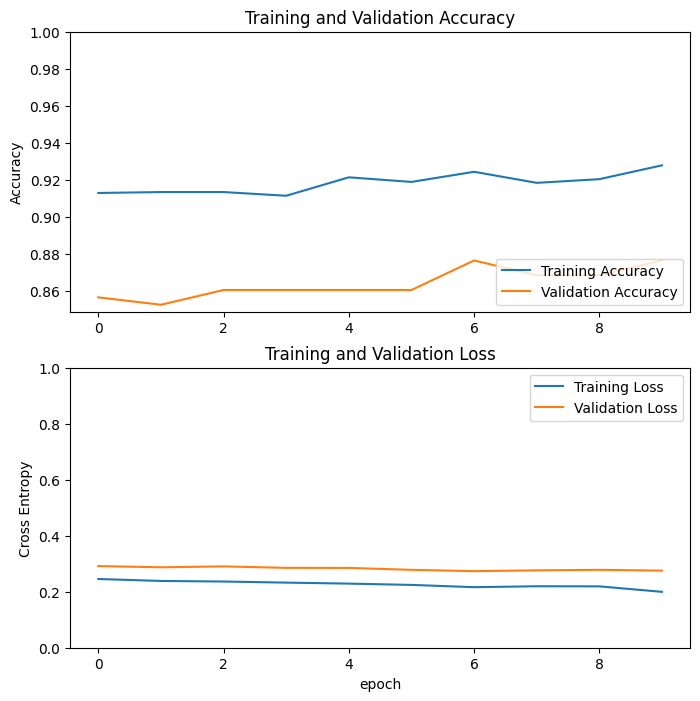

In [47]:
#Learning curves
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [48]:
base_model.trainable = True

In [49]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  475


In [55]:
#ReCompiling model for fine tuning
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                       tf.keras.metrics.Precision(name='precision'),
                       tf.keras.metrics.Recall(name='recall')
                       ]
              )

In [56]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb4 (Functional)     │ (None, 5, 5, 1792)     │    17,673,823 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1792)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1792)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │         1,793 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,675,616 (67.43 MB)

 Trainable params: 17,463,649 (66.62 MB)

 Non-trainable params: 211,967 (828.00 KB)

In [57]:
len(model.trainable_variables)

333

In [58]:
#Fine Tuning
fine_tune_epochs = 5
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=len(history.epoch),
                         validation_data=validation_dataset)

Epoch 11/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 616s 8s/step - accuracy: 0.8069 - loss: 0.5375 - precision: 0.7535 - recall: 0.7772 - val_accuracy: 0.8924 - val_loss: 0.3191 - val_precision: 0.8854 - val_recall: 0.8416
Epoch 12/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 513s 8s/step - accuracy: 0.9496 - loss: 0.1339 - precision: 0.9339 - recall: 0.9344 - val_accuracy: 0.9562 - val_loss: 0.3407 - val_precision: 0.9091 - val_recall: 0.9901
Epoch 13/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 566s 8s/step - accuracy: 0.9928 - loss: 0.0284 - precision: 0.9970 - recall: 0.9850 - val_accuracy: 0.9681 - val_loss: 0.2371 - val_precision: 0.9697 - val_recall: 0.9505
Epoch 14/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 513s 8s/step - accuracy: 0.9742 - loss: 0.0721 - precision: 0.9606 - recall: 0.9752 - val_accuracy: 0.9402 - val_loss: 0.2589 - val_precision: 0.9057 - val_recall: 0.9505
Epoch 15/15
63/63 ━━━━━━━━━━━━━━━━━━━━ 582s 8s/step - accuracy: 0.9799 - loss: 0.0635 - precision: 0.9699 - recall: 0.9787 - val_accuracy: 0.9602 - val_loss: 0.

In [59]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [60]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

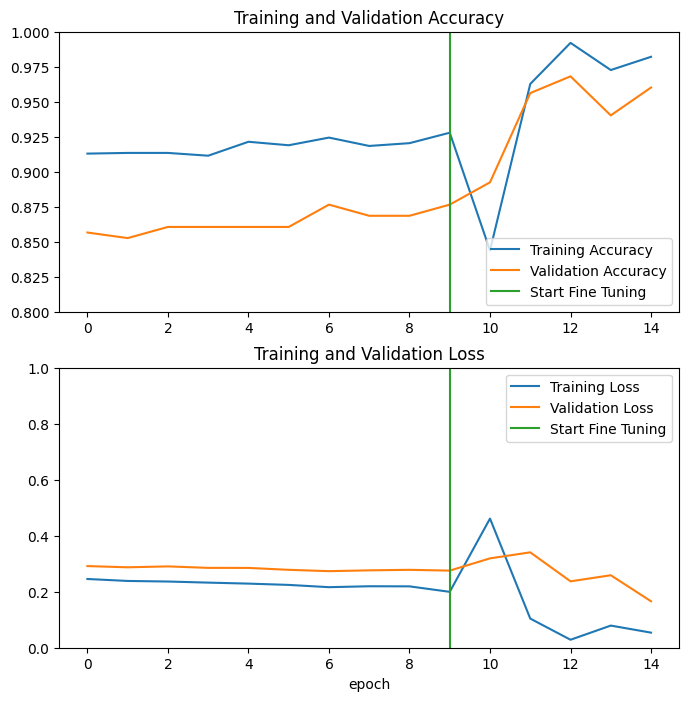

In [61]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

#**Evaluation & Prediction**

In [63]:
loss, accuracy, precision, recall = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)
print('Test Precision:', precision)
print('Test Recall:', recall)

8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.9459 - loss: 0.2326 - precision: 0.9191 - recall: 0.9647
Test accuracy : 0.9563491940498352
Test Precision: 0.9252336621284485
Test Recall: 0.970588207244873


Predictions:
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Labels:
 [0 0 0 0 0 0 0 1 1 0 1 1 1 0 0 0 0 1 0 0 0 1 1 1 0 0 1 1 0 0 1 1]


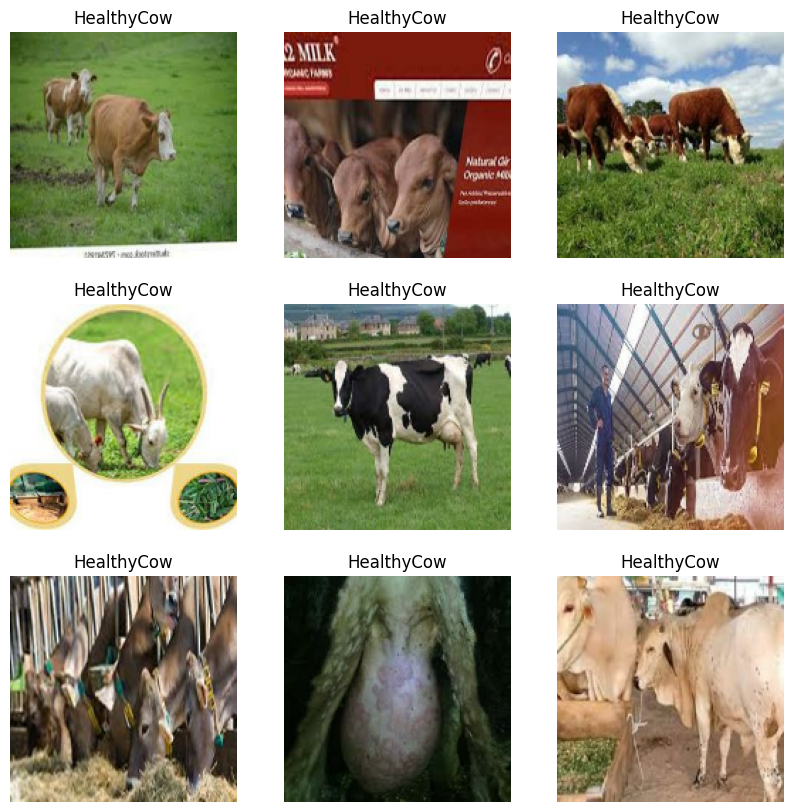

In [64]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)
predictions = tf.argmax(predictions, axis=1)

print('Predictions:\n', predictions.numpy())
print('Labels:\n', label_batch)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predictions[i]])
  plt.axis("off")

In [65]:
model.save("Lumpy_cow_CNNmodel.keras")